In [5]:
!pip3 install pytube
!pip3 install youtube_transcript_api
!pip3 install opencv-python

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


# Step 1: Video library

In [2]:
from pytube import YouTube
from youtube_transcript_api import YouTubeTranscriptApi

class YouTubeDownloader:
    def __init__(self, video_url):
        self.video_url = video_url
        self.youtube = YouTube(video_url)

    def download_video(self, output_path=None):
        video_stream = self.youtube.streams.get_highest_resolution()
        if output_path is None:
            output_path = f"{self.youtube.title}.mp4"
        video_stream.download(output_path)
        return output_path

    def download_captions(self, output_path=None):
        if output_path is None:
            output_path = f"{self.youtube.title}.txt"

        captions = YouTubeTranscriptApi.get_transcript(self.youtube.video_id)
        with open(output_path, 'w', encoding='utf-8') as file:
            for caption in captions:
                file.write(caption['text'] + '\n')

        return output_path

In [3]:
video_urls = ["https://www.youtube.com/watch?v=wbWRWeVe1XE", "https://www.youtube.com/watch?v=FlJoBhLnqko","https://www.youtube.com/watch?v=Y-bVwPRy_no"]
def download(video_urls):
  for video_url in video_urls:
    downloader = YouTubeDownloader(video_url)
    video_path = downloader.download_video()
    print(f"Video downloaded at: {video_path}")
    captions_path = downloader.download_captions()
    print(f"Captions downloaded at: {captions_path}")

download(video_urls)

Video downloaded at: What Does 'High-Quality' Preschool Look Like? | NPR Ed.mp4
Captions downloaded at: What Does 'High-Quality' Preschool Look Like? | NPR Ed.txt
Video downloaded at: How Green Roofs Can Help Cities | NPR.mp4
Captions downloaded at: How Green Roofs Can Help Cities | NPR.txt
Video downloaded at: Why It’s Usually Hotter In A City | Let's Talk | NPR.mp4
Captions downloaded at: Why It’s Usually Hotter In A City | Let's Talk | NPR.txt


In [4]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from glob import glob

import IPython.display as ipd
from tqdm.notebook import tqdm
from PIL import Image

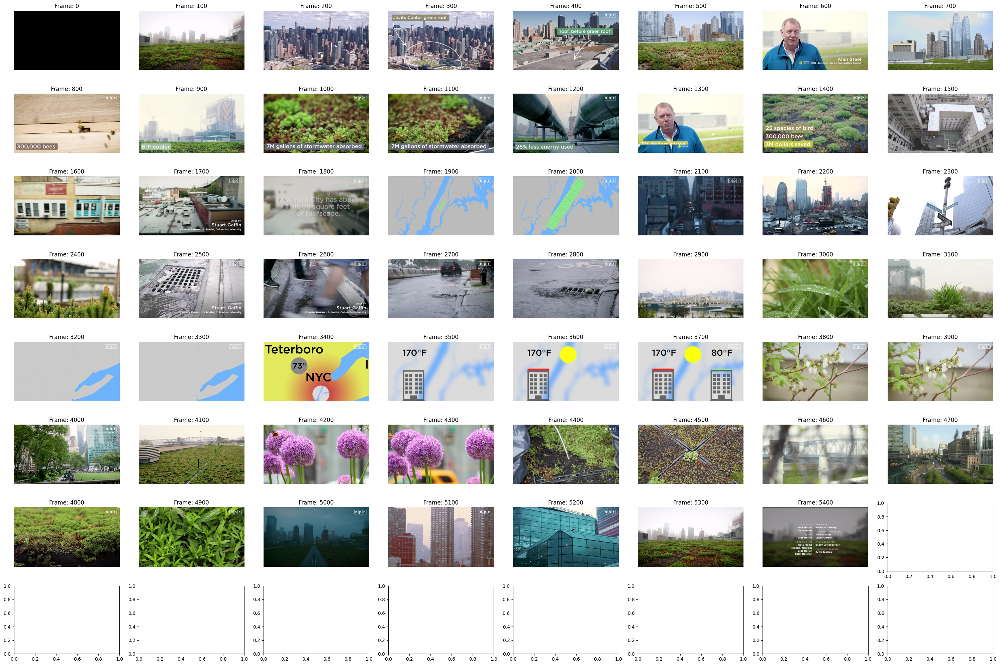

In [6]:
video_path = 'How Green Roofs Can Help Cities | NPR.mp4/How Green Roofs Can Help Cities  NPR.mp4'

fig, axs = plt.subplots(8, 8, figsize=(30, 20))
axs = axs.flatten()

cap = cv2.VideoCapture(video_path)
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 100 == 0:
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f'Frame: {frame}')
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()
plt.show()
cap.release()

# Step 2: Video indexing pipeline
## 2.1 Preprocess the video 

In [8]:
from ultralytics import YOLO
def preprocess_and_detect(video_paths):
    results_table = []
    frames = []
    for x in range(len(video_paths)):
        cap = cv2.VideoCapture(video_paths[x])
        n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        fps = int(cap.get(cv2.CAP_PROP_FPS))
        sampled_frame_indices = np.linspace(30, n_frames - 1, int(n_frames/10), dtype=int)
        sample_idx = 0
        for i in sampled_frame_indices:
            cap.set(cv2.CAP_PROP_POS_FRAMES, i)
            ret, img = cap.read()
            if ret == False:
                break
            # Scale the image (optional)
            img = cv2.resize(img, (256, 256))  # Example scaling to 256x256

            # Normalize the image (assuming 8-bit depth)
            img = img.astype(np.float32) / 255.0

            # Convert to RGB and display
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            frames.append(img)
            # Detect objects
            timestamp = i / fps
            data = detect_object(x, sample_idx , img, timestamp)
            sample_idx +=1
            if data is not None:
                results_table.extend(data)
        cap.release()
    np.save(f"frames.npy", np.array(frames))
    return results_table

## 2.2 Detecting objects

In [10]:
model = YOLO("yolov8m.pt")
def convert_image(frames):
    image = Image.fromarray((frames * 255).astype(np.uint8))
    return image

def detect_object(vidId, frameNum, image, timestamp):
    results = model.predict(convert_image(image), verbose=False)
    result = results[0] 
    if len(result.boxes) > 0:
        data = []
        for box in result.boxes:
            detectedObjId = box.cls[0].item()
            detectedObjClass = result.names[detectedObjId]
            confidence = round(box.conf[0].item(), 2)
            cords = box.xyxy[0].tolist()
            bbox_info = [round(x) for x in cords] # Bounding box coordinates
            frameNumID = f"{vidId}_{frameNum}"
            formatted_timestamp = format_timestamp(timestamp)
            data.append([vidId, frameNumID, formatted_timestamp, detectedObjId, detectedObjClass, confidence, bbox_info])
        return data
    else:
        return None

def format_timestamp(seconds):
    minutes = int(seconds // 60)
    seconds = int(seconds % 60)
    return f"{minutes:02d}:{seconds:02d}"

100%|██████████| 49.7M/49.7M [00:01<00:00, 37.2MB/s]


In [11]:
video_paths = ['How Green Roofs Can Help Cities | NPR.mp4/How Green Roofs Can Help Cities  NPR.mp4', "What Does 'High-Quality' Preschool Look Like? | NPR Ed.mp4/What Does High-Quality Preschool Look Like  NPR Ed.mp4", "Why It’s Usually Hotter In A City | Let's Talk | NPR.mp4/Why It’s Usually Hotter In A City  Lets Talk  NPR.mp4"]
results_table = preprocess_and_detect(video_paths=video_paths)

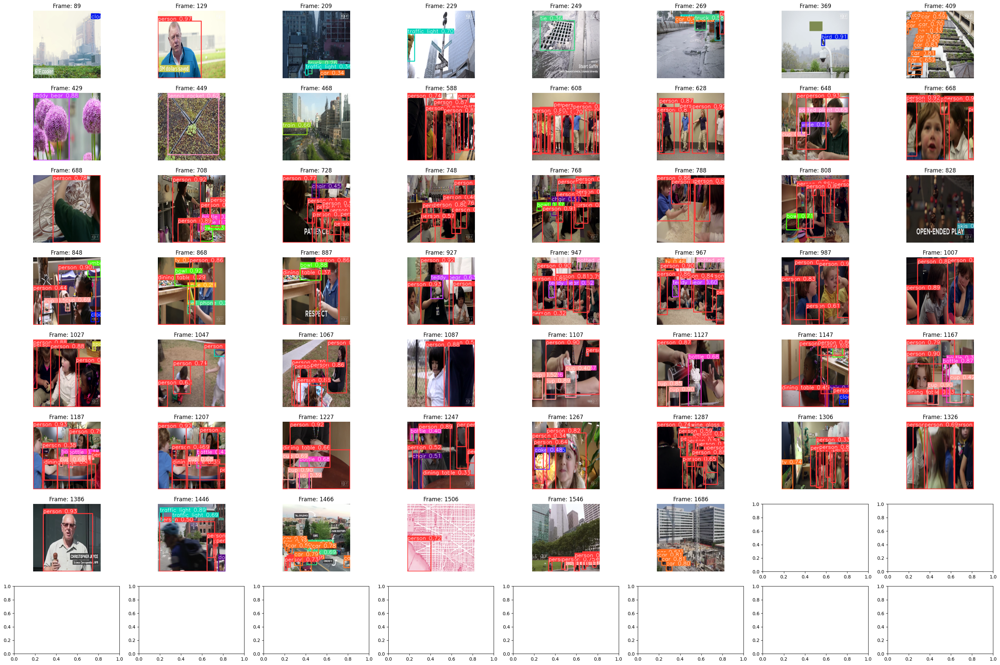

In [55]:
# Show example
frames = np.load("../video-search/frames.npy")
fig, axs = plt.subplots(8, 8, figsize=(30, 20))
axs = axs.flatten()
img_idx = 0

n_frames = len(frames)
sampled_frame_indices = np.linspace(30, n_frames - 1, int(n_frames/20), dtype=int)
for i in sampled_frame_indices:
    results = model.predict(convert_image(frames[i]), verbose=False)
    result = results[0] 
    if len(result.boxes) > 0:
        axs[img_idx].imshow(Image.fromarray(result.plot()[:,:,::-1]))
        axs[img_idx].set_title(f'Frame: {i}')
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()
plt.show()

## 2.3 Embedding model

In [56]:
num_frames = [549,820,358] # total number of sample frames from 3 videos respectively

def get_roi(frames, results_table):
    rois = []
    labels = []
    for result in results_table:
        vidID, frameID = map(int, result[1].split('_'))
        frame_idx = sum(num_frames[:vidID]) + frameID
        frame = frames[frame_idx]
        bbox_info = result[6]
        roi = frame[bbox_info[1]:bbox_info[3], bbox_info[0]:bbox_info[2]]
        rois.append(roi)
        labels.append(result[4])
    return rois, labels
rois, labels = get_roi(frames, results_table)

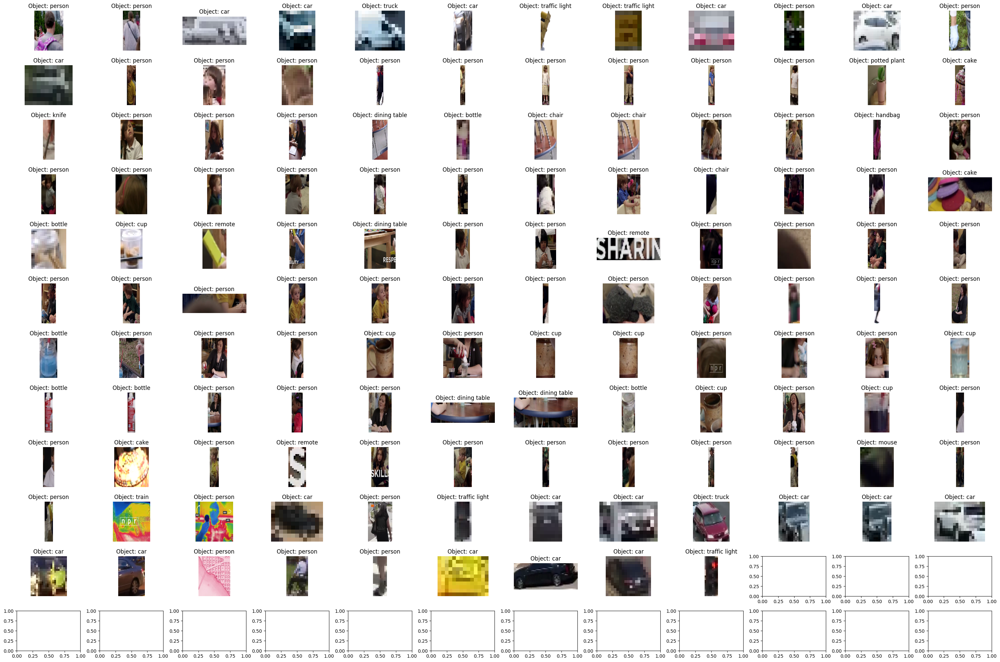

In [57]:
fig, axs = plt.subplots(12, 12, figsize=(30, 20))
axs = axs.flatten()
img_idx = 0
for i in range(len(rois)):
    if (i % 50 == 0):
        axs[img_idx].imshow(rois[i])
        axs[img_idx].set_title(f'Object: {labels[i]}')
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()
plt.show()

person


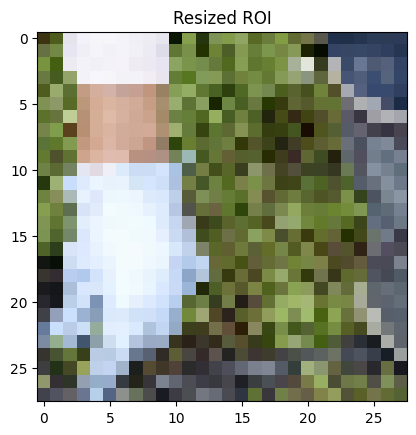

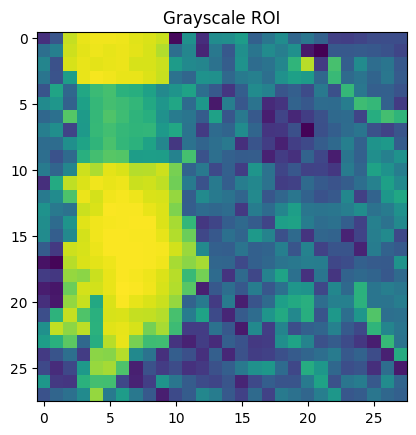

(6442, 28, 28, 1)


In [58]:
resized_rois = [cv2.resize(roi, (28, 28)) for roi in rois]
gray_rois = [np.expand_dims(cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY), 2) for roi in resized_rois]
gray_rois = np.array(gray_rois)
print(labels[10])
# Visualize one of the resized and gray ROIs
plt.imshow(resized_rois[555])
plt.title('Resized ROI')
plt.show()

plt.imshow(gray_rois[555])
plt.title('Grayscale ROI')
plt.show()

print(np.array(gray_rois).shape)

In [60]:
import numpy as np
from tensorflow.keras.layers import Dense, Input,Conv2D,MaxPooling2D,UpSampling2D, Flatten, Reshape
from tensorflow.keras.models import Model
from tensorflow.keras.activations import sigmoid
from tensorflow.python.keras import optimizers

In [61]:
def autoencoder(input_img):
    #encoder
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)
    flatten = Flatten()(conv3)
    reshape = Reshape((7, 7, 128))(flatten)
    #decoder
    conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(reshape)
    up1 = UpSampling2D((2,2))(conv4)
    conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(up1)
    up2 = UpSampling2D((2,2))(conv5)
    decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(up2)
    return decoded


In [62]:
batch_size = 128
epochs = 50
inChannel = 1
x, y = 28, 28
input_img = Input(shape = (x, y, inChannel))
embedding_vector = autoencoder(input_img)

In [63]:
autoencoder = Model(input_img, autoencoder(input_img))
autoencoder.compile(loss='mean_squared_error', optimizer = 'rmsprop')

In [64]:
autoencoder.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 28, 28, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 14, 14, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 7, 7, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_1 (Reshape)             │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 7, 7, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 14, 14, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_3 (UpSampling2D)  │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 28, 28, 1)      │           577 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 314,625 (1.20 MB)

 Trainable params: 314,625 (1.20 MB)

 Non-trainable params: 0 (0.00 B)

In [65]:
from sklearn.model_selection import train_test_split
train_X,valid_X,train_ground,valid_ground = train_test_split(gray_rois,
                                                             gray_rois, 
                                                             test_size=0.2, 
                                                             random_state=13)

In [66]:
autoencoder_train = autoencoder.fit(train_X, train_ground, batch_size=batch_size,epochs=epochs,verbose=1,validation_data=(valid_X, valid_ground))

Epoch 1/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.0551 - val_loss: 0.0264
Epoch 2/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - loss: 0.0233 - val_loss: 0.0169
Epoch 3/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.0181 - val_loss: 0.0195
Epoch 4/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.0156 - val_loss: 0.0125
Epoch 5/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.0139 - val_loss: 0.0145
Epoch 6/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 4s 108ms/step - loss: 0.0130 - val_loss: 0.0155
Epoch 7/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 4s 109ms/step - loss: 0.0124 - val_loss: 0.0122
Epoch 8/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step - loss: 0.0116 - val_loss: 0.0120
Epoch 9/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 4s 105ms/step - loss: 0.0111 - val_loss: 0.0114
Epoch 10/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step - loss: 0.0109 - val_loss: 0.0108
Epoch 11/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 4s 104ms/step - loss: 0.0108 - val_loss: 0.0093
Epoch 12/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 4s 105ms/step 

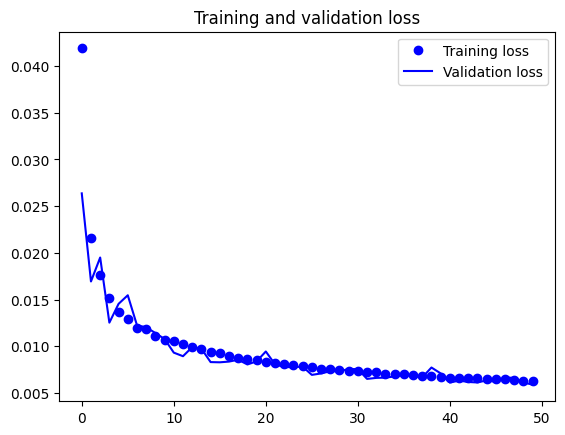

In [67]:
loss = autoencoder_train.history['loss']
val_loss = autoencoder_train.history['val_loss']
epochs = range(epochs)
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()


In [69]:
# Create a new model that extracts the output from the 6th layer
layer_output_model = Model(inputs=autoencoder.input, outputs=autoencoder.layers[6].output)
embedding_vectors = layer_output_model.predict(gray_rois)
print(autoencoder.layers[6])
print(embedding_vectors.shape)

202/202 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
<Flatten name=flatten_1, built=True>
(6442, 6272)


In [70]:
def add_vector_to_results(results_table, embedding_vectors):
    return [row + [vector] for row, vector in zip(results_table, embedding_vectors)]

final_results_table = add_vector_to_results(results_table, embedding_vectors)

# Step 3: Indexing the embeddings

In [71]:
!pip3 install python-dotenv
!pip3 install psycopg2-binary

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [76]:
import os
from dotenv import load_dotenv
import psycopg2
from psycopg2 import pool, extras

In [181]:
# Load environment variables
load_dotenv()
host = os.getenv("POSTGRES_HOST")
dbname = os.getenv("POSTGRES_DB_NAME")
user = os.getenv("POSTGRES_USER")
password = os.getenv("POSTGRES_PASSWORD")
sslmode = "require"
table_name = "searchvectors"

# Build a connection string from the variables
conn_string = "host={0} user={1} dbname={2} password={3} sslmode={4}".format(host, user, dbname, password, sslmode)

postgreSQL_pool = psycopg2.pool.SimpleConnectionPool(1, 20, conn_string)
if (postgreSQL_pool):
    print("Connection pool created successfully")

# Get a connection from the connection pool
conn = postgreSQL_pool.getconn()
cursor = conn.cursor()


Connection pool created successfully


In [182]:
frame_IDs = list(row[1] for row in results_table)
df_files = pd.DataFrame(frame_IDs, columns=['frame_ID'])
df_embeddings = pd.DataFrame([str(emb.tolist()) for emb in embedding_vectors], columns=['embedding'])
df_keys = pd.DataFrame(range(len(df_files)), columns=['primary_key'])
df = pd.concat([df_keys, df_files, df_embeddings], axis=1)
df.head(5)

,primary_key,frame_ID,embedding
0,0,0_9,"[0.0, 0.0, 0.0, 0.08287332952022552, 0.0265645..."
1,1,0_9,"[0.0, 0.04806787893176079, 0.04568999633193016..."
2,2,0_9,"[0.0, 0.019133906811475754, 0.0566719174385070..."
3,3,0_9,"[0.0, 0.11788812279701233, 0.18413685262203217..."
4,4,0_9,"[0.0, 0.0, 0.0, 0.07289011776447296, 0.0583800..."


In [183]:
from io import StringIO
sio = StringIO()
writer = csv.writer(sio)
writer.writerows(df.values)
sio.seek(0)

cursor.execute("CREATE TEMPORARY TABLE vector (primary_key SERIAL PRIMARY KEY, frame_ID TEXT, embedding VECTOR(6272)) ON COMMIT DROP;")

cursor.copy_expert("COPY vector FROM STDIN CSV", sio)

cursor.execute(f"""INSERT INTO {table_name} (primary_key, frame_ID, embedding)
                SELECT * FROM vector
                ON conflict (primary_key) DO NOTHING;""")

conn.commit()


In [188]:
import math
def get_cosine_similarity(vector1, vector2):
    """
    Get the cosine similarity between two vectors
    """
    dot_product = 0
    length = min(len(vector1), len(vector2))

    for i in range(length):
        dot_product += vector1[i] * vector2[i]

    magnitude1 = math.sqrt(sum(x * x for x in vector1))
    magnitude2 = math.sqrt(sum(x * x for x in vector2))

    return dot_product / (magnitude1 * magnitude2)

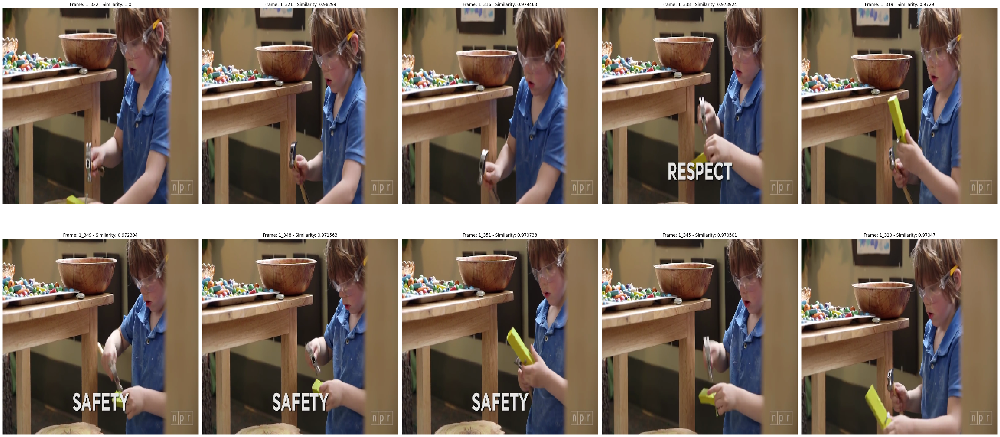

In [320]:
import random
random_index = random.randint(0, len(embedding_vectors) - 1)
img_embedding_to_search = embedding_vectors[random_index]
# Vector search
topn = 10
cursor.execute(f"SELECT * FROM {table_name} ORDER BY embedding <=> %s LIMIT {topn}", (str(img_embedding_to_search.tolist()),))
rows = cursor.fetchall()

#display sample
fig, axs = plt.subplots(2, 5, figsize=(40, 20))
axs = axs.flatten()
img_idx = 0

for row in rows:
    vidID, frameID = map(int, row[1].split('_'))
    frame_idx = sum(num_frames[:vidID]) + frameID
    img_embedding_result =  np.fromstring(row[2][1:-1], dtype=np.float32, sep=',')
    cosine_similarity = round(get_cosine_similarity(img_embedding_to_search, img_embedding_result),6)
    axs[img_idx].imshow(frames[frame_idx])
    axs[img_idx].set_title(f'Frame: {row[1]} - Similarity: {cosine_similarity}')
    axs[img_idx].axis('off')
    img_idx += 1

plt.tight_layout()
plt.show()


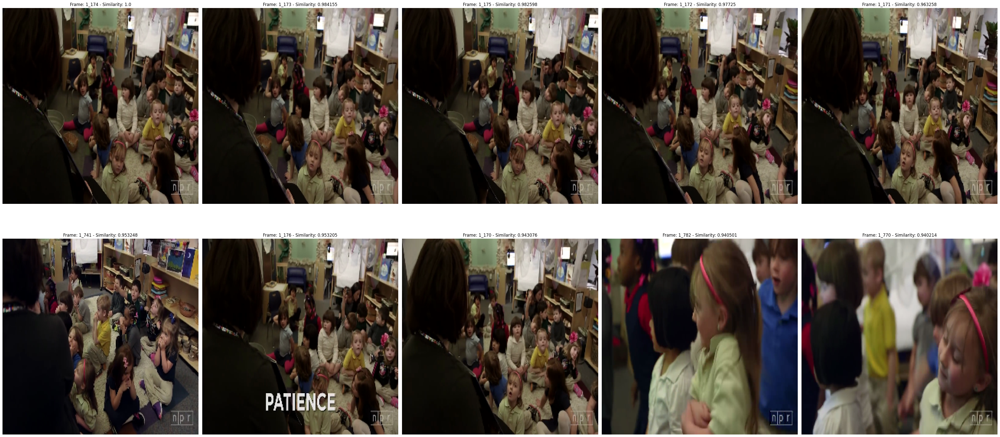

In [321]:
import random
random_index = random.randint(0, len(embedding_vectors) - 1)
img_embedding_to_search = embedding_vectors[random_index]
# Vector search
topn = 10
cursor.execute(f"SELECT * FROM {table_name} ORDER BY embedding <=> %s LIMIT {topn}", (str(img_embedding_to_search.tolist()),))
rows = cursor.fetchall()

#display sample
fig, axs = plt.subplots(2, 5, figsize=(40, 20))
axs = axs.flatten()
img_idx = 0

for row in rows:
    vidID, frameID = map(int, row[1].split('_'))
    frame_idx = sum(num_frames[:vidID]) + frameID
    img_embedding_result =  np.fromstring(row[2][1:-1], dtype=np.float32, sep=',')
    cosine_similarity = round(get_cosine_similarity(img_embedding_to_search, img_embedding_result),6)
    axs[img_idx].imshow(frames[frame_idx])
    axs[img_idx].set_title(f'Frame: {row[1]} - Similarity: {cosine_similarity}')
    axs[img_idx].axis('off')
    img_idx += 1

plt.tight_layout()
plt.show()
